The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


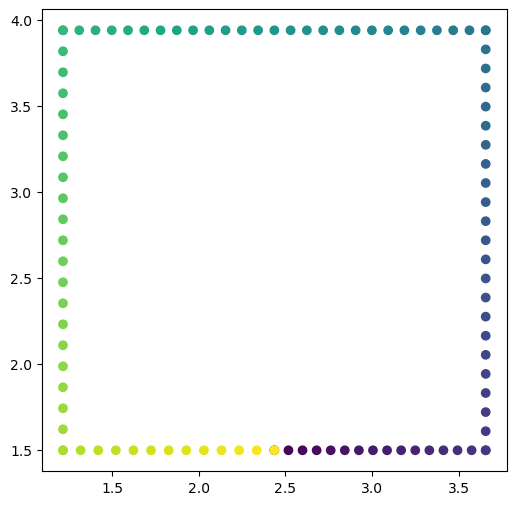

In [3]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.insert(1, '../')
import numpy as np 
import matplotlib.pyplot as plt
import rooms.dataset
import render
import trajectory
from IPython.display import Audio


D = rooms.dataset.dataLoader("dampenedBase")


# Compute Trajectory
keypoint_times = np.array([0, 6.35, 15.51, 26.12, 34.48, 39.54])

tile = 0.6096
z = 1.565
x_0 = 2.436
y_0 = 1.650

x_max = x_0 + 2*tile
x_min = x_0 - 2*tile
y_max = y_0 + 4*tile


segment_lengths = np.diff(keypoint_times)/39.54
num_points = 100
segment_num_points = (np.round(segment_lengths*100)).astype(int)


segment_0_x = np.linspace(x_0, x_max, 16)
segment_0_y = np.linspace(y_0, y_0, 16)

segment_1_x = np.linspace(x_max, x_max, 23)
segment_1_y = np.linspace(y_0, y_max, 23)

segment_2_x = np.linspace(x_max, x_min, 27)
segment_2_y = np.linspace(y_max, y_max, 27)


segment_3_x = np.linspace(x_min, x_min, 21)
segment_3_y = np.linspace(y_max, y_0, 21)

segment_4_x = np.linspace(x_min, x_0, 13)
segment_4_y = np.linspace(y_0, y_0, 13)


x = np.concatenate((segment_0_x, segment_1_x, segment_2_x, segment_3_x, segment_4_x)) 
y = np.concatenate((segment_0_y, segment_1_y, segment_2_y, segment_3_y, segment_4_y))- 0.15


plt.figure(figsize=(6,6))
circle_points = np.stack((x,y, 1.565*np.ones(100)),axis=-1)
plt.scatter(circle_points[:,0], circle_points[:,1], c=np.arange(100))

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


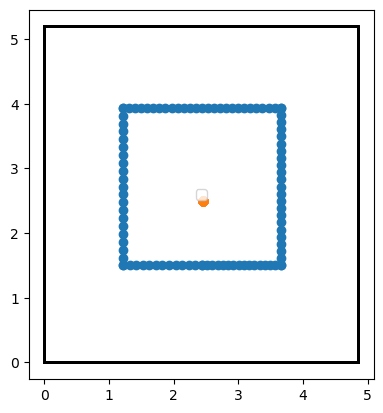

In [5]:
# Compute forward and left facing vectors
forwards = np.array(100*[np.array([0,1,0])])
lefts = []
for i in range(forwards.shape[0]):
    lefts.append(np.array([-forwards[i,1], forwards[i,0], 0 ]))
lefts=np.array(lefts)


# Source xyz does not change
source_xyzs = np.array([D.speaker_xyz]*100)

T = trajectory.Trajectory("DampenedTraj", "dampenedBase",circle_points, forwards, lefts, source_xyzs, None, None)
T.source_axis_1s = [None]*100
T.source_axis_2s = [None]*100

# Plot trajectory points (orange is speaker location)
T.plot_traj()

In [ ]:
T.save_paths() # Trace and store paths
R = render.Renderer(n_surfaces=6, toa_perturb=False)
R = R.cuda()
T.get_RIRs(R,"../models/dampenedBase/weights.pt") # Compute RIRs using pretrained model
T.load_RIRs() # Load RIRs

T.convolve_audio("GoldenSlumbersMono.wav", cutoff=1897920) # Render Audio
rendered_audio = T.fill("GoldenSlumbersMono.wav", fade_length=5)

In [9]:
Audio(rendered_audio, rate=48000) # Play Rendered Audio